In [2]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress
from scipy import fftpack
import os
import glob

# Generating Trees

First, we define the following functions to plot a recursive tree as follows:

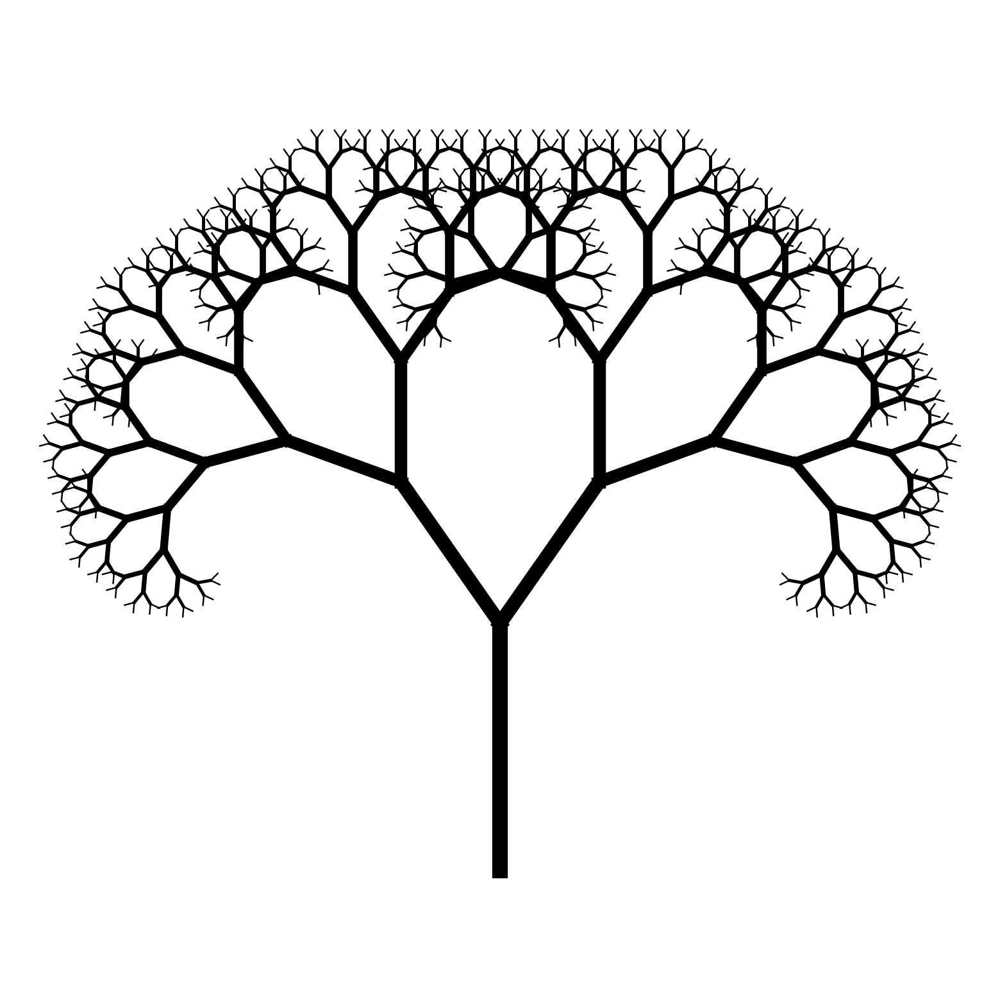

In [2]:

def draw_tree(ax, x, y, length, angle, depth, width_scale=0.7, angle_change=35):
    if depth == 0:
        return

    x_end = x + length * np.cos(np.radians(angle))
    y_end = y + length * np.sin(np.radians(angle))

    lw = 35 * (depth / 20)

    ax.plot([x, x_end], [y, y_end], color='black', lw=lw)

    draw_tree(ax, x_end, y_end, length * 0.7, angle - angle_change, depth - 1, width_scale)
    draw_tree(ax, x_end, y_end, length * 0.7, angle + angle_change, depth - 1, width_scale)


def fractal_tree(length, depth, filename, width_scale=0.7, angle_change=35):

    fig, ax = plt.subplots(figsize=(20, 20))
    ax.set_aspect('equal', 'box')
    ax.axis('off')
    ax.set_xlim(-length*2, length*2)
    ax.set_ylim(-length, length*3)

    draw_tree(ax, 0, -length/2, length, 90, depth, width_scale, angle_change)

    plt.show()

    fig.savefig(filename, bbox_inches='tight', pad_inches=0, dpi=300)
    plt.close(fig)


fractal_tree(length=50, depth=10,filename = 'fractal.png',width_scale=0.7, angle_change=35)

Now we allow the code to introduce variation

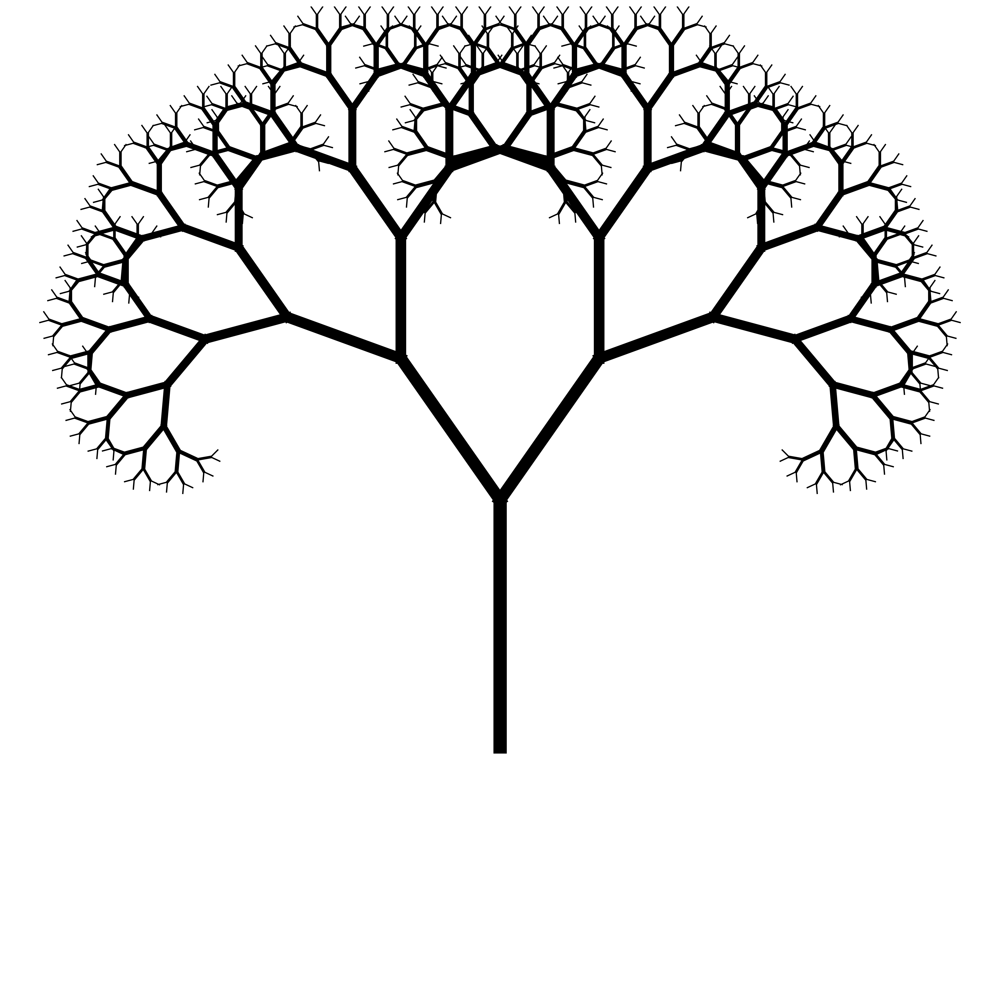

In [3]:
def draw_tree(ax, x, y, length, angle, depth, angle_variation, length_variation, width_variation):
    """
    Recursively draw branches of a fractal tree with variations in angle, length, and width.

    Args:
    ax (matplotlib.axes.Axes): The axes object where the tree is drawn.
    x, y (float): Starting position of the branch.
    length (float): Length of the branch.
    angle (float): Angle of the branch.
    depth (int): Depth of recursion, determines when to stop.
    angle_variation (float): Variation added to the angle of each branch.
    length_variation (float): Factor to reduce the length of branches in each recursive call.
    width_variation (float): Scaling factor for the linewidth of each branch.
    """
    if depth == 0:
        return

    x_end = x + length * np.cos(np.radians(angle))
    y_end = y + length * np.sin(np.radians(angle))

    lw = width_variation * (depth / 10)
    ax.plot([x, x_end], [y, y_end], color='black', lw=lw)

    angle_left = angle - 35 + angle_variation
    angle_right = angle + 35 + angle_variation

    draw_tree(ax, x_end, y_end, length * length_variation, angle_left, depth - 1, angle_variation, length_variation, width_variation)
    draw_tree(ax, x_end, y_end, length * length_variation, angle_right, depth - 1, angle_variation, length_variation, width_variation)

def fractal_tree(length, depth, angle_variation, length_variation, width_variation, filename):
    """
    Create and display a fractal tree with given parameters and save it to a file.

    Args:
    length (float): Initial length of the trunk.
    depth (int): Number of recursive branch generations.
    angle_variation (float): Variance in branch angles.
    length_variation (float): Factor to decrease the branch length in each recursion.
    width_variation (float): Base width of the trunk, scales with depth.
    filename (str): File path where the image will be saved.
    """
    fig, ax = plt.subplots(figsize=(20, 20), dpi=300)  # Set the figure size and DPI to match the high-resolution requirements
    ax.set_aspect('equal', 'box')
    ax.axis('off')
    ax.set_xlim(-length*2, length*2)
    ax.set_ylim(-length, length*3)

    draw_tree(ax, 0, 0, length, 90, depth, angle_variation, length_variation, width_variation)

    plt.show()
    fig.savefig(filename, bbox_inches='tight', pad_inches=0)
    plt.close(fig)

# Example call to fractal_tree with specified variations
fractal_tree(length=50, depth=10, angle_variation=0, length_variation=0.7, width_variation=15, filename='fractal.png')


## Angle Variations

In [ ]:
def create_fractal_trees(base_params, variations, output_dir):
    """
    Generate a series of fractal trees based on base parameters and a set of angle variations.

    Args:
    base_params (dict): Parameters for the base tree.
    variations (list): List of angle variations to apply.
    output_dir (str): Directory to save the output images.
    """
    # Ensure the output directory exists
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Create the base tree with specified parameters
    base_params['filename'] = os.path.join(output_dir, base_params['filename'])
    fractal_tree(**base_params)

    # Create variations based on the angle variations
    for angle in variations:
        params = base_params.copy()
        params['angle_variation'] = angle
        params['filename'] = os.path.join(output_dir, f'fractal_angle_{angle:.2f}.png')
        fractal_tree(**params)

        
# Base parameters for the fractal tree
base_params = {
    'length': 30,
    'depth': 10,
    'angle_variation': 0,
    'length_variation': 0.75,
    'width_variation': 15,
    'filename': 'fractal_angle_0.00.png'
}

# Generate angle variations using linspace, excluding the initial 0
angle_variations = np.linspace(0, 20, 21)[1:]  # exclude the first element which is 0

# Output directory
output_directory = 'varied_angles'

# Call the function to generate the trees
create_fractal_trees(base_params, angle_variations, output_directory)


## Width Variations

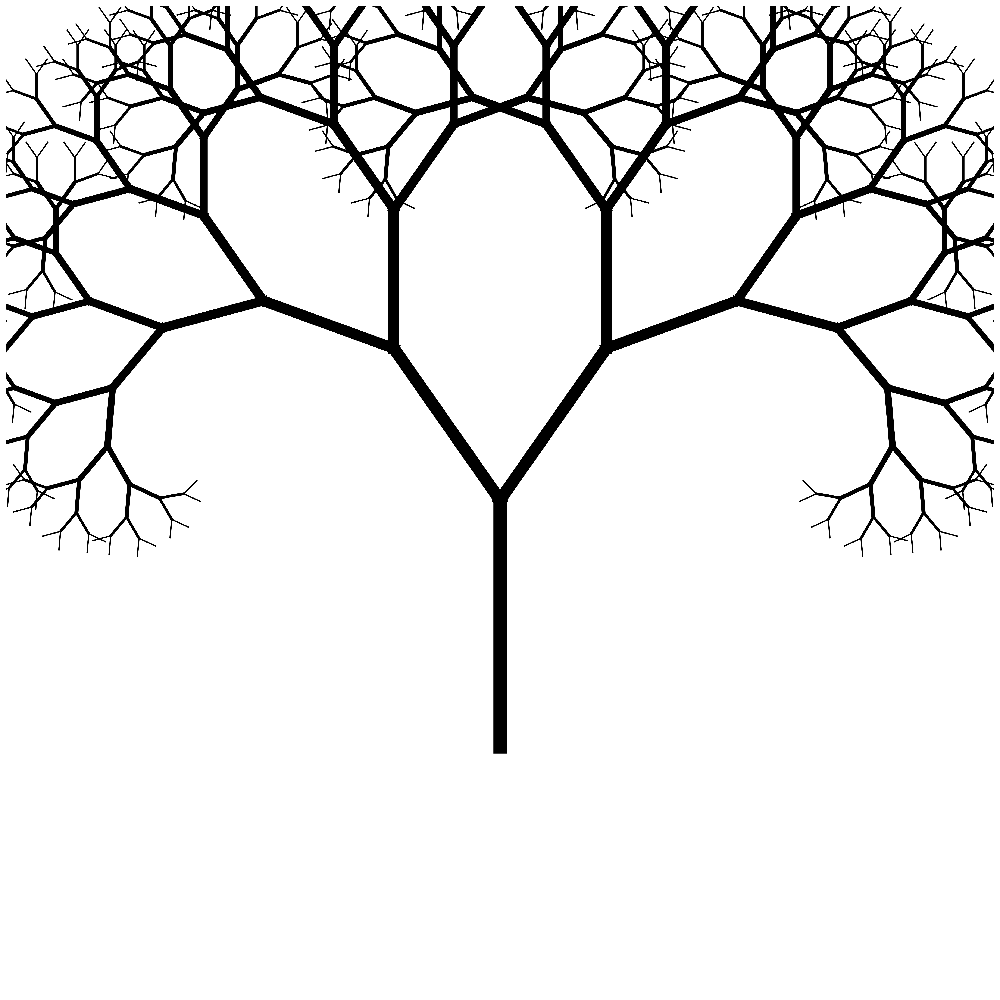

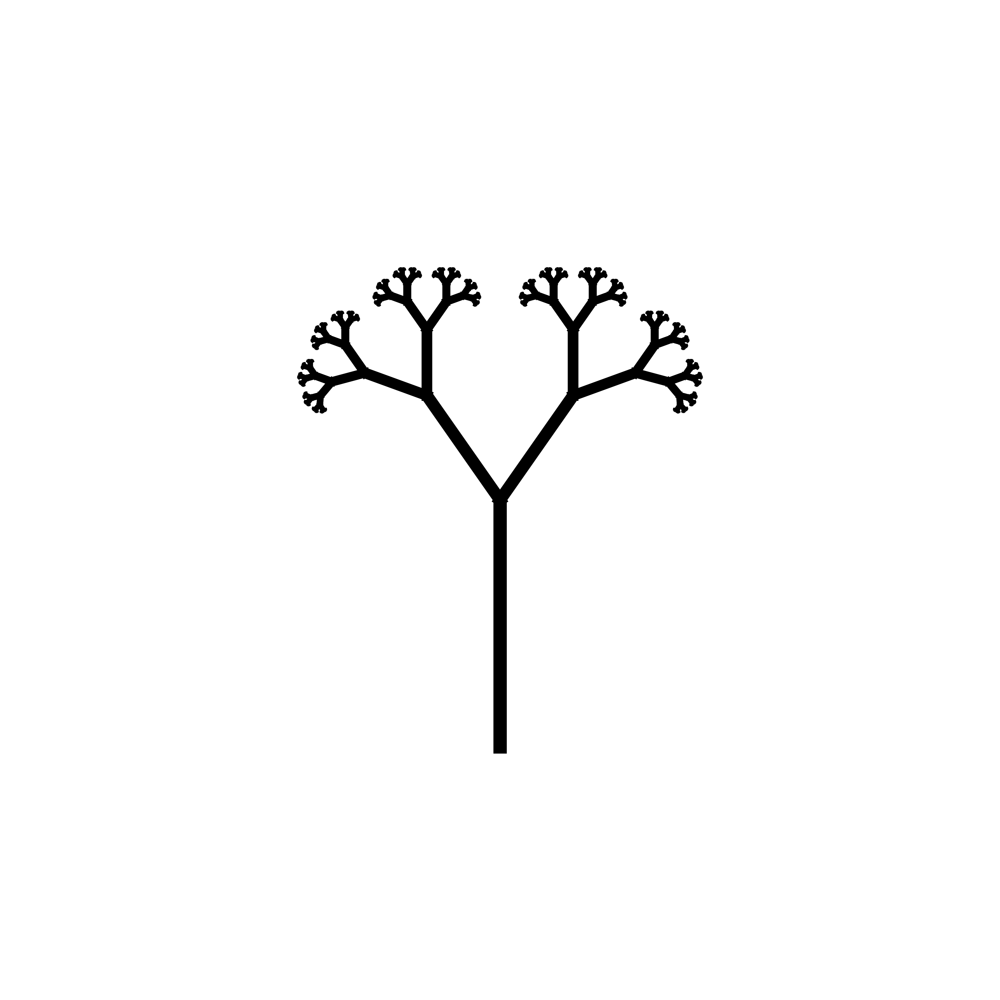

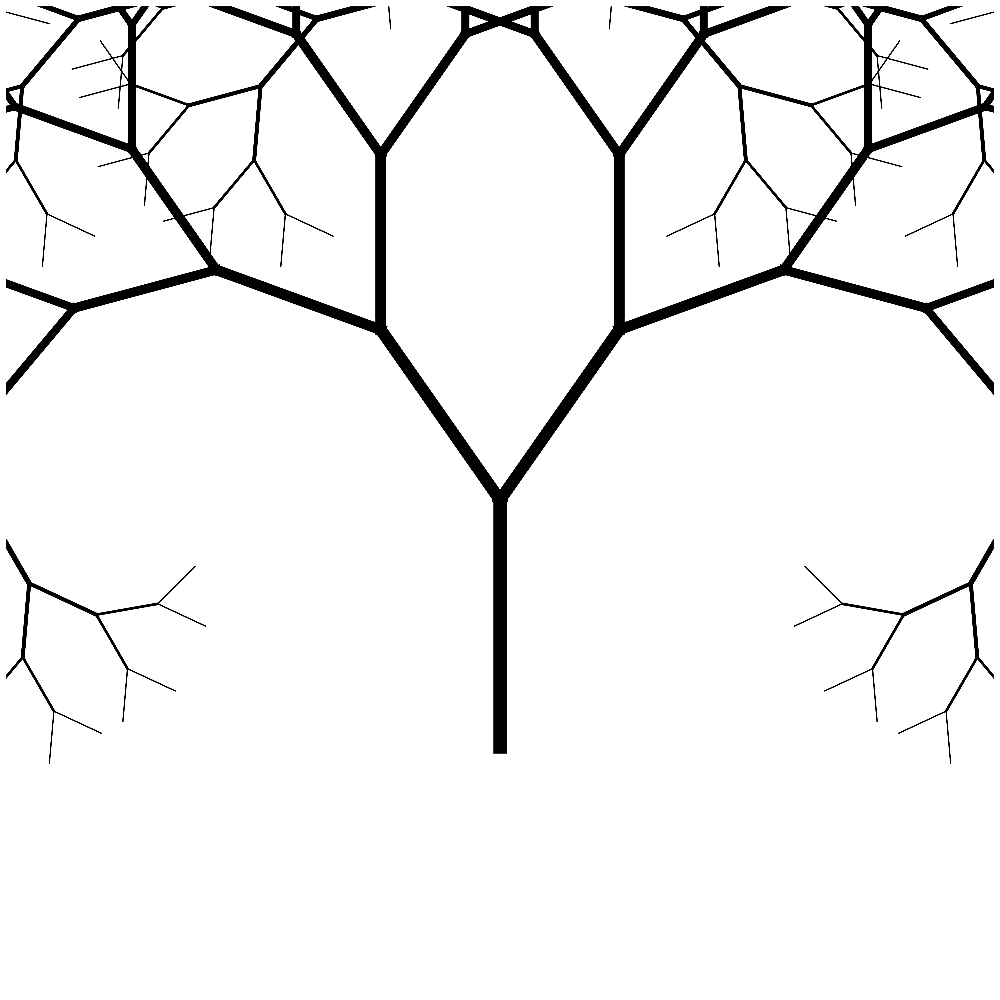

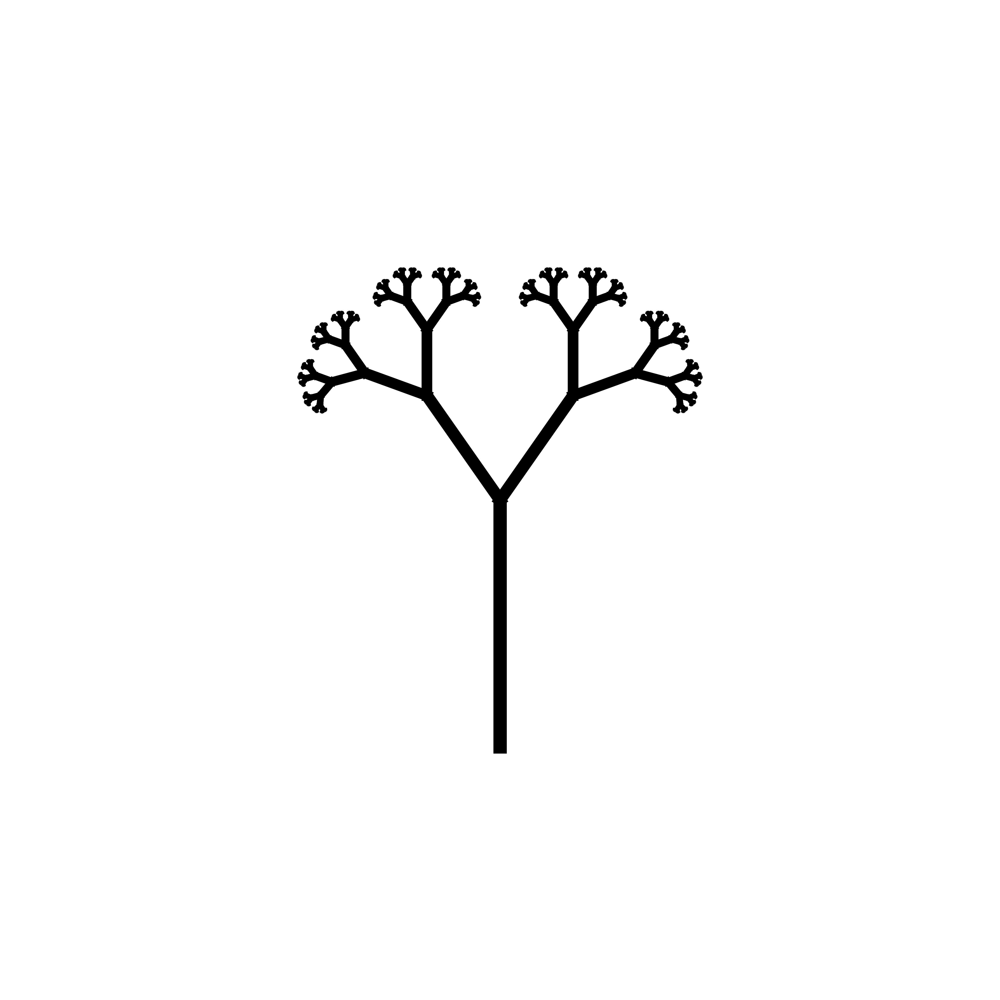

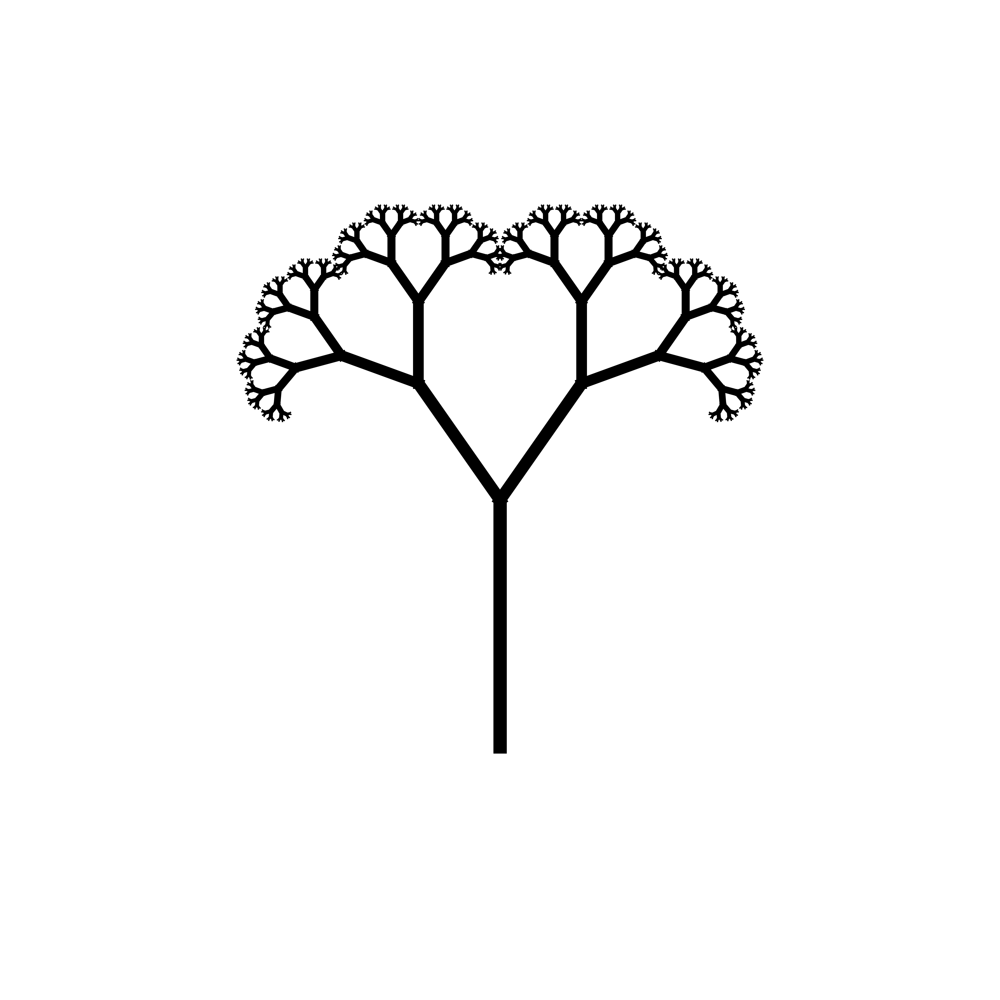

...

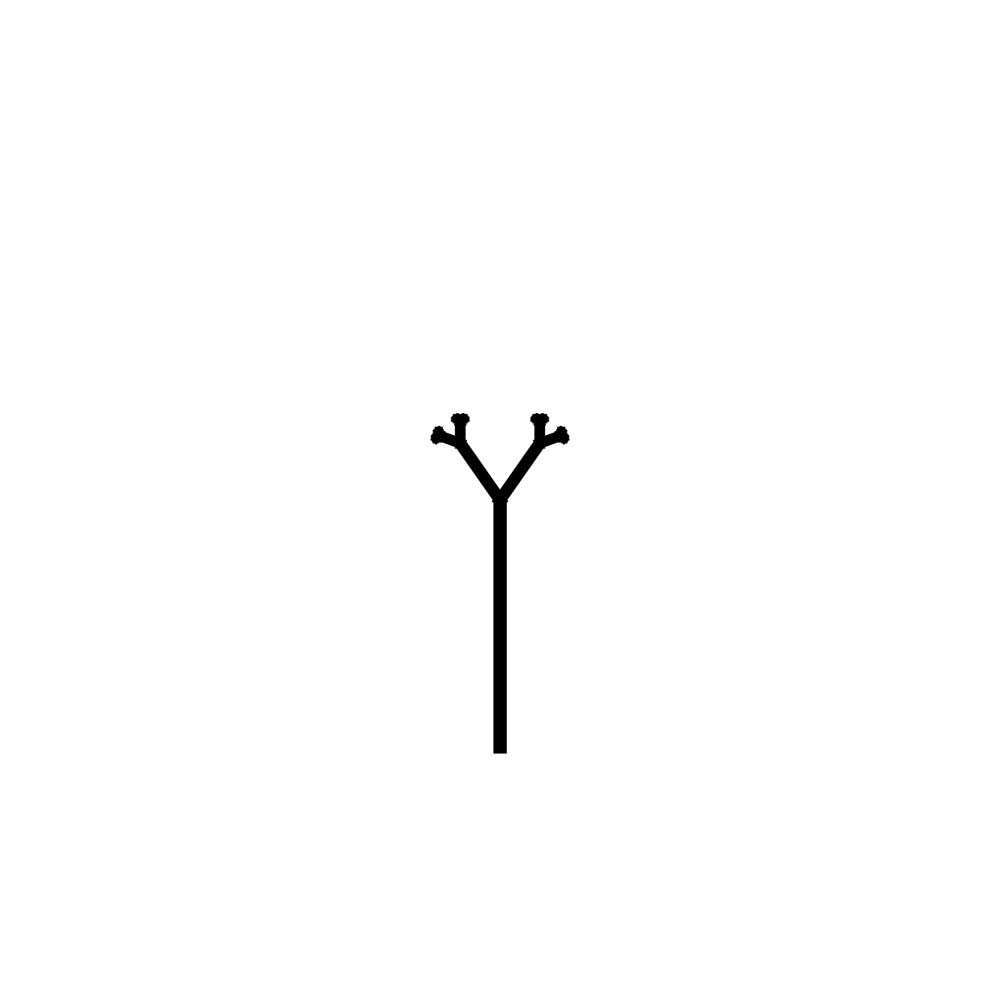

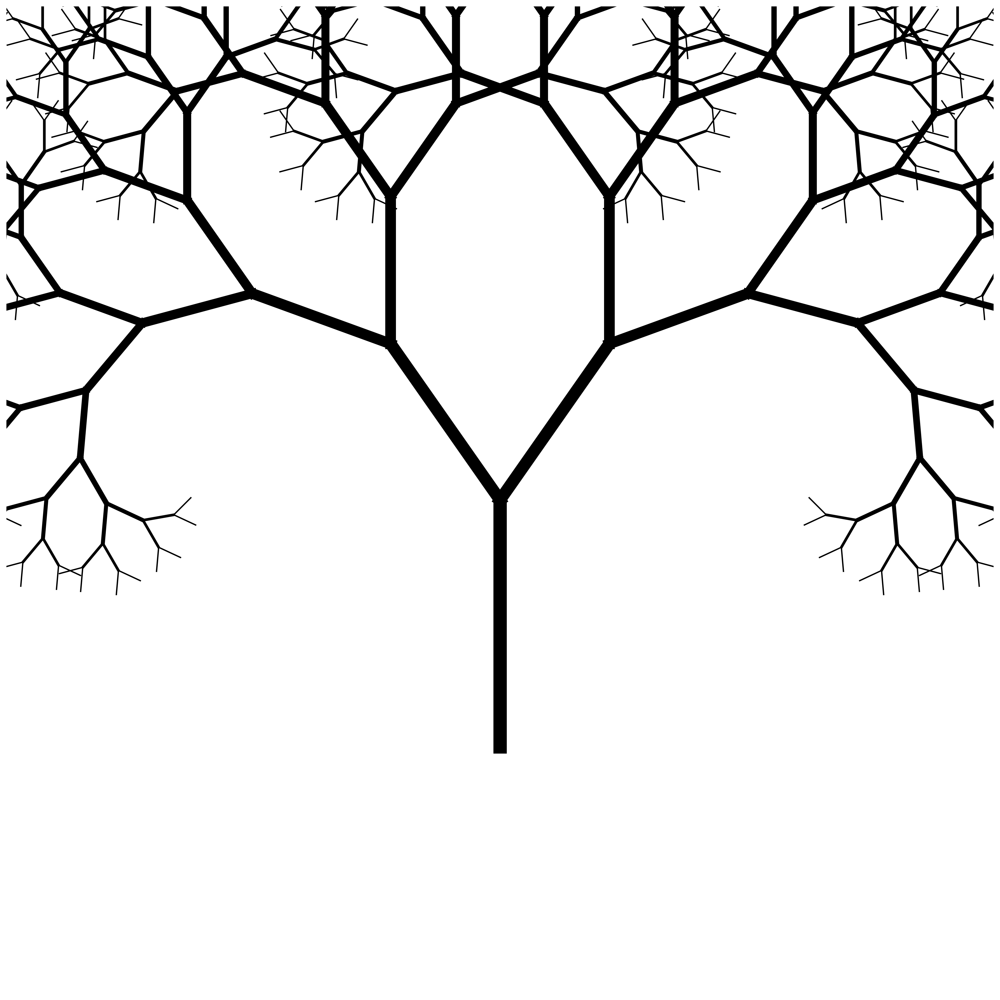

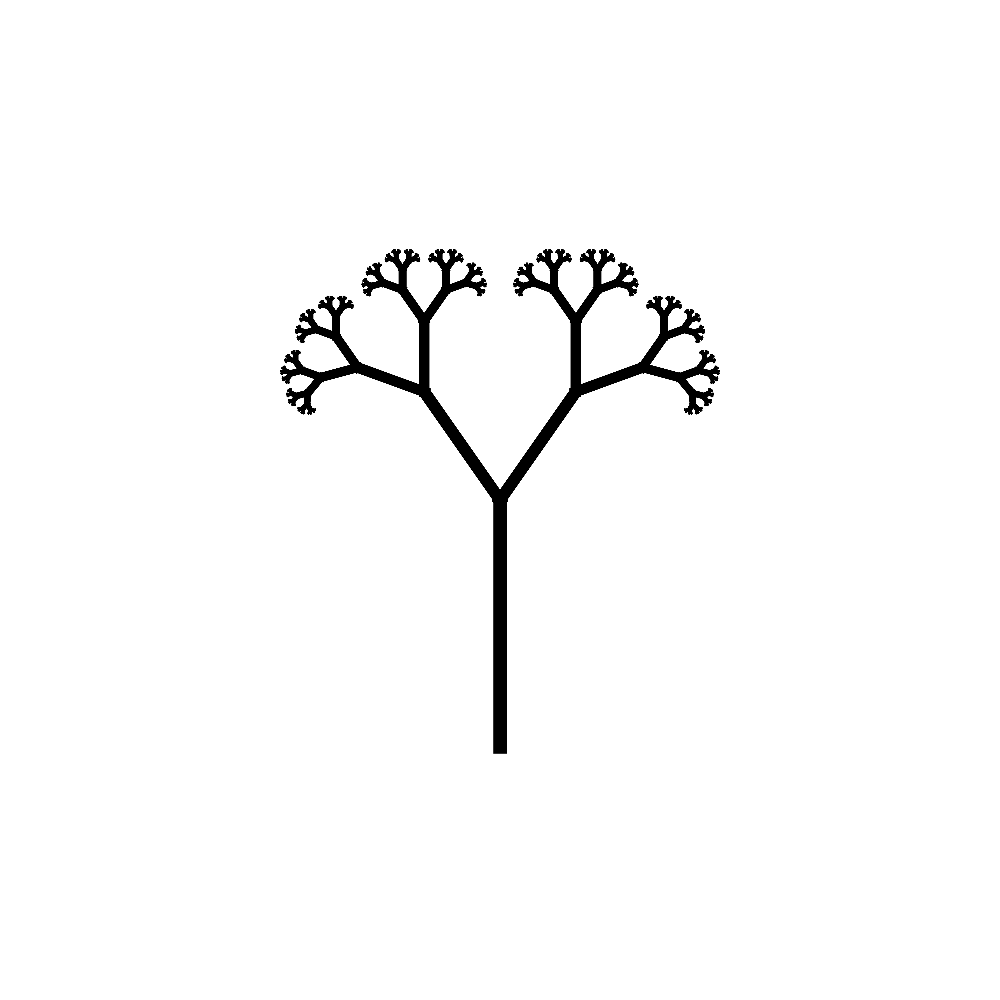

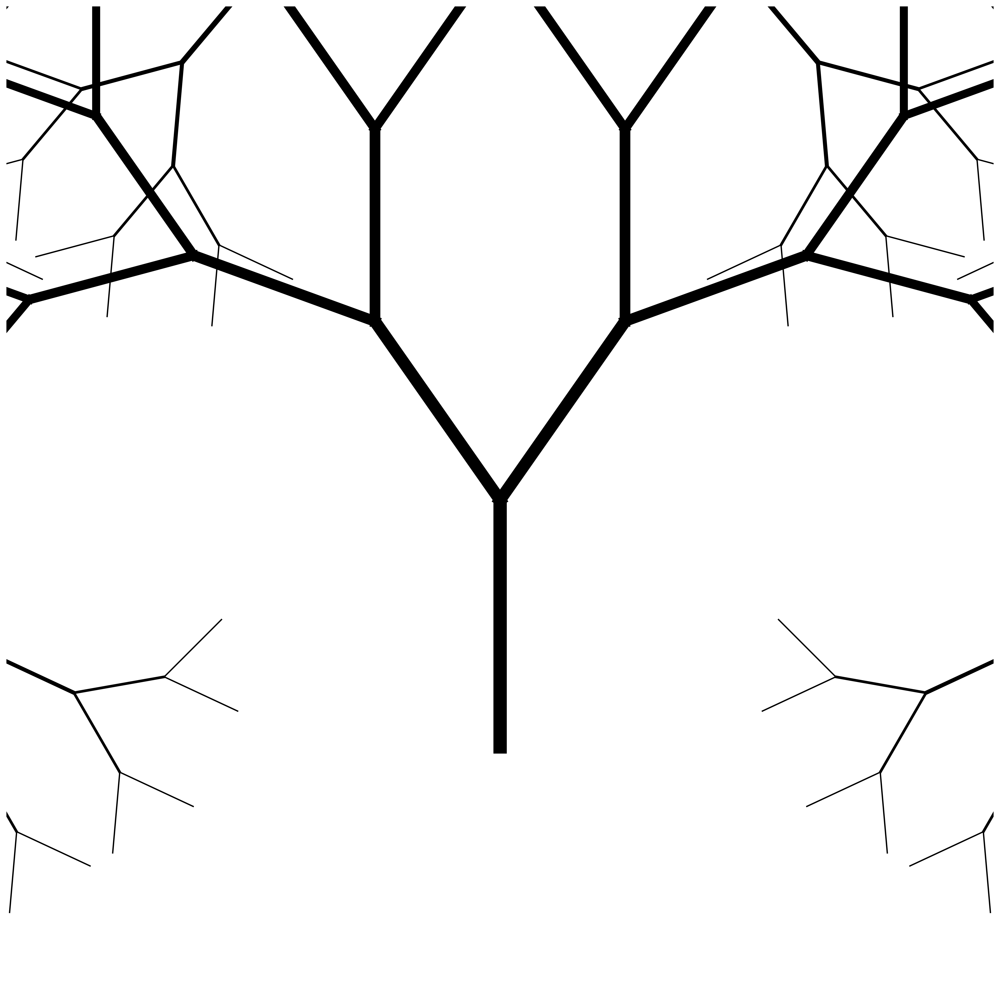

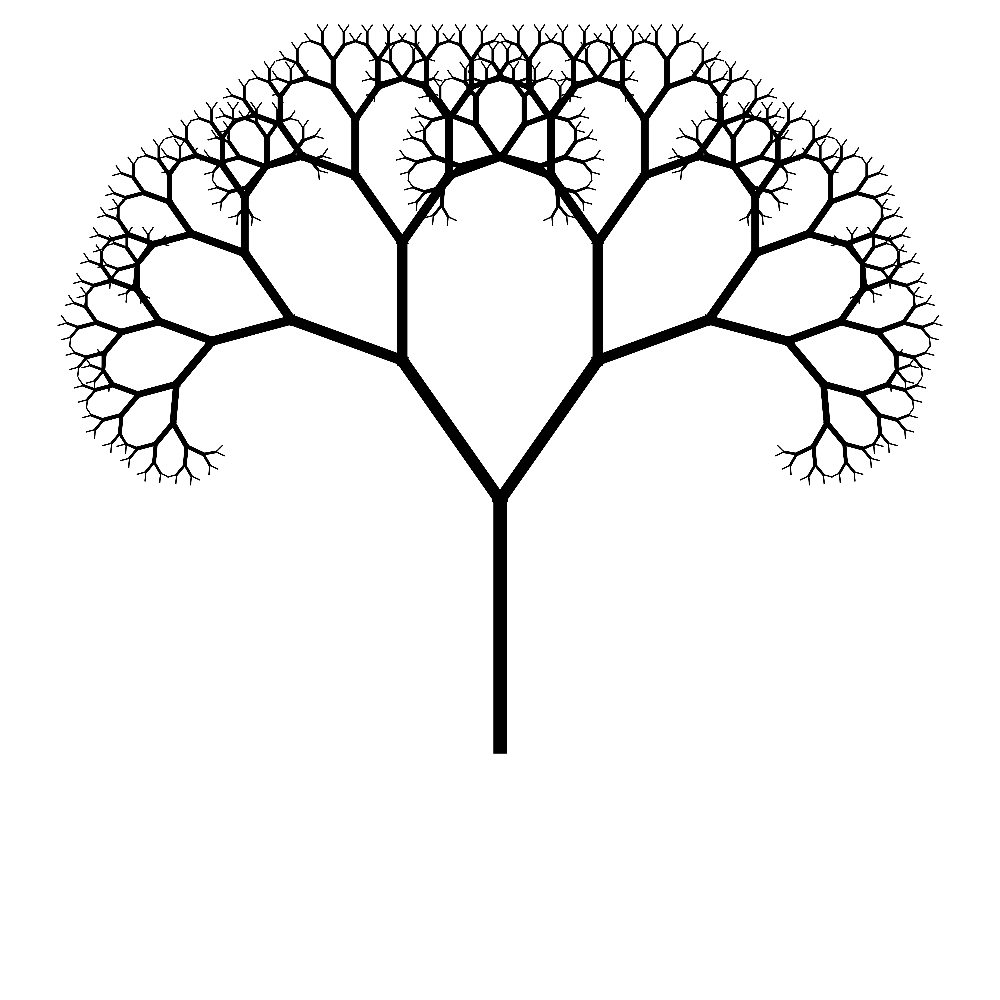

In [28]:
def create_fractal_trees(base_params, variations, output_dir):
    """
    Generate a series of fractal trees based on base parameters and a set of angle variations.

    Args:
    base_params (dict): Parameters for the base tree.
    variations (list): List of angle variations to apply.
    output_dir (str): Directory to save the output images.
    """
    # Ensure the output directory exists
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Create the base tree with specified parameters
    base_params['filename'] = os.path.join(output_dir, base_params['filename'])
    fractal_tree(**base_params)

    # Create variations based on the angle variations
    for length in variations:
        params = base_params.copy()
        params['length_variation'] = length
        params['filename'] = os.path.join(output_dir, f'fractal_length_{length:.2f}.png')
        fractal_tree(**params)


# Base parameters for the fractal tree
base_params = {
    'length': 30,
    'depth': 10,
    'angle_variation': 0,
    'length_variation': 0.75,
    'width_variation': 15,
    'filename': 'fractal_length_0.75.png'
}

# Generate angle variations using linspace, excluding the initial 0
length_variations = np.random.uniform(size = 20) # exclude the first element which is 0

# Output directory
output_directory = 'varied_lengths'

# Call the function to generate the trees
create_fractal_trees(base_params, length_variations, output_directory)


In [27]:
np.random.uniform(size = 20)

array([0.5086159 , 0.46135362, 0.51978779, 0.02434089, 0.05570682,
       0.29689328, 0.84643671, 0.70468719, 0.52185493, 0.09497667,
       0.58224258, 0.78477435, 0.71069056, 0.4229102 , 0.7481582 ,
       0.20857441, 0.5972921 , 0.44497695, 0.37961039, 0.2188297 ])

# Analysing Trees

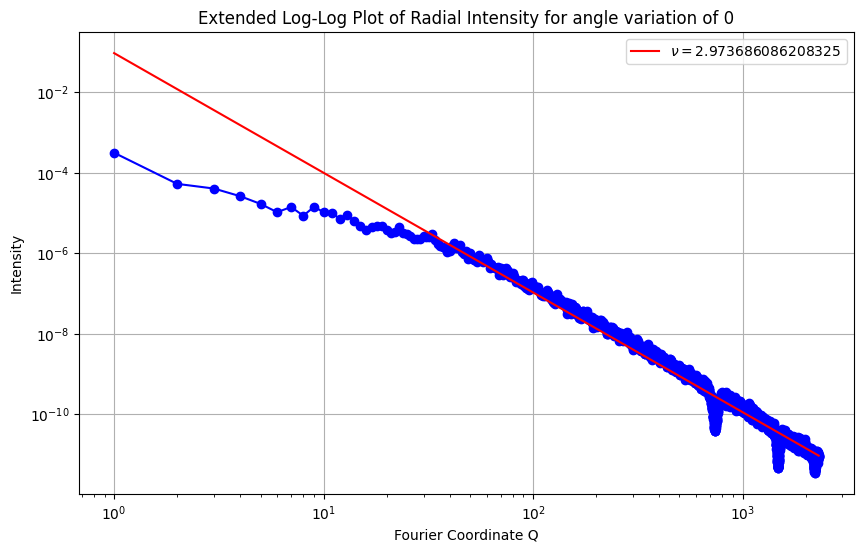

In [3]:

# Load the uploaded image and ensure it is grayscale
# image_path = 'fractal.png'
image_path = 'varied_lengths/fractal_length_0.75.png'
image = plt.imread(image_path)
if image.ndim == 3:
    image = np.mean(image, axis=2)  # Convert to grayscale if it's in color

# Normalize image to [0, 1]
image = image / image.max()

# Perform FFT and compute power spectrum
f = fftpack.fftshift(fftpack.fft2(image))
power_spectrum = np.abs(f)**2 / f.size  # Normalize by the number of pixels

# Function for radial profile calculation with extended binning
def radial_profile(data, center, max_radius):
    y, x = np.indices(data.shape)
    r = np.sqrt((x - center[0])**2 + (y - center[1])**2)
    r = r.astype(int)
    tbin = np.bincount(r.ravel(), data.ravel(), minlength=max_radius+1)
    nr = np.bincount(r.ravel(), minlength=max_radius+1)
    nr[nr == 0] = 1  # Avoid division by zero
    radialprofile = tbin / nr
    return radialprofile[:max_radius+1]

# Calculate the center and max radius based on image dimensions
center = (image.shape[0] // 2, image.shape[1] // 2)
max_radius = np.min(center)

# Calculate the extended radial profile
radial_prof = radial_profile(power_spectrum, center, max_radius)
radial_prof = radial_prof/np.max(radial_prof)

# Prepare Q values avoiding the zero frequency
Q_extended = np.arange(1, len(radial_prof))

m,b = np.polyfit(np.log10(Q_extended), np.log10(radial_prof[1:]), 1)

linear_fit_results = m*np.log10(Q_extended) + b


# Plotting the results on a log-log scale
plt.figure(figsize=(10, 6))
plt.loglog(Q_extended, radial_prof[1:], marker='o', linestyle='-', color='blue')
plt.loglog(Q_extended, 10**(linear_fit_results), linestyle='-', color='red', label=rf'$\nu = {-m}$')
plt.xlabel('Fourier Coordinate Q')
plt.ylabel('Intensity')
plt.title('Extended Log-Log Plot of Radial Intensity for angle variation of 0')
plt.legend()
plt.grid(True)
plt.show()


In [4]:
def radial_profile(data, center, max_radius):
    y, x = np.indices(data.shape)
    r = np.sqrt((x - center[0])**2 + (y - center[1])**2)
    r = r.astype(int)
    tbin = np.bincount(r.ravel(), data.ravel(), minlength=max_radius+1)
    nr = np.bincount(r.ravel(), minlength=max_radius+1)
    nr[nr == 0] = 1  # Avoid division by zero
    radialprofile = tbin / nr
    return radialprofile[:max_radius+1]

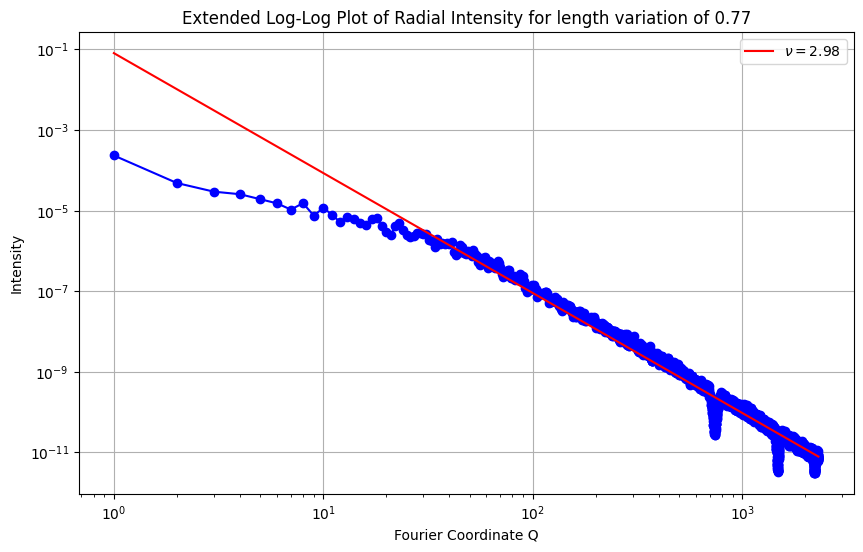

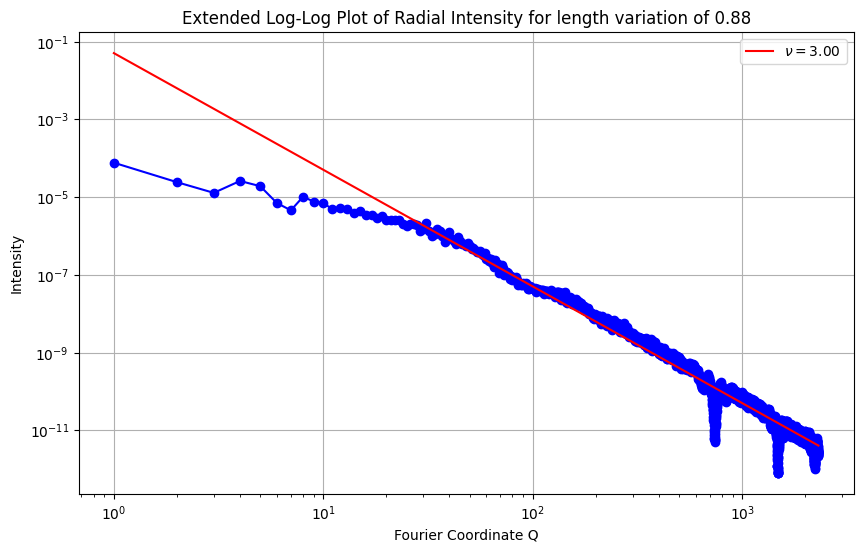

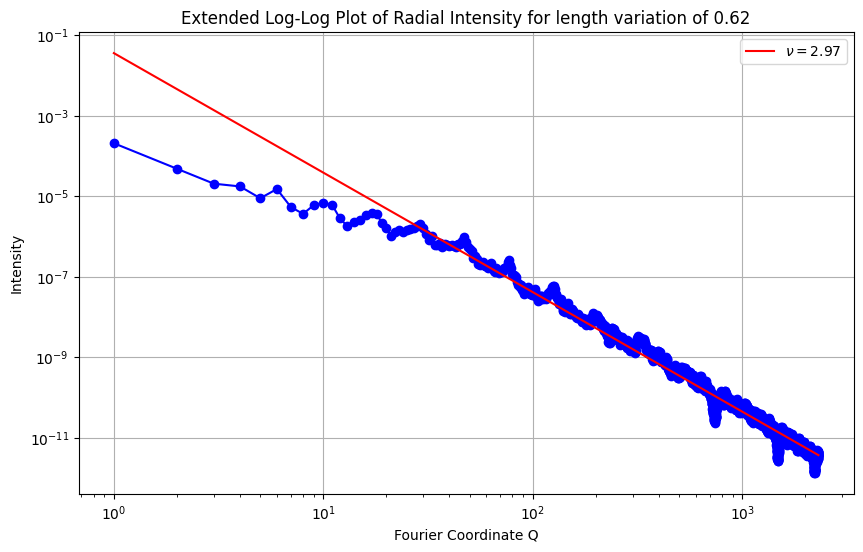

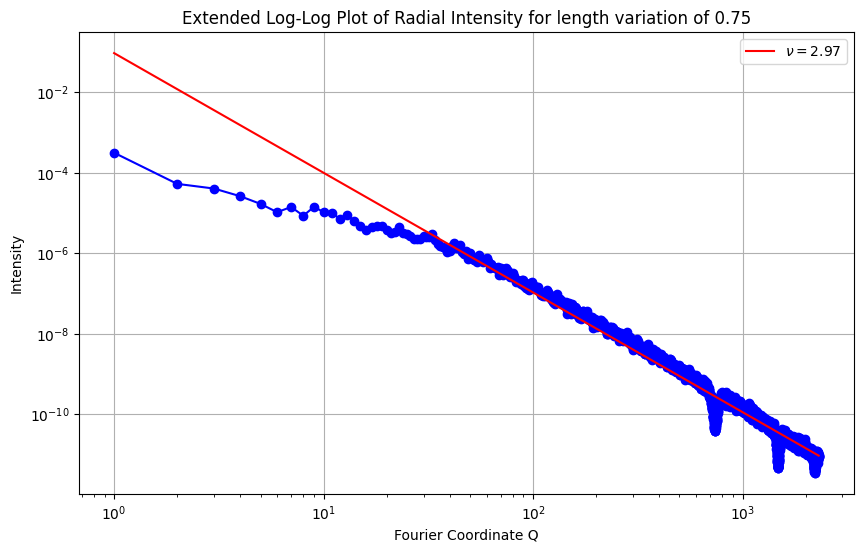

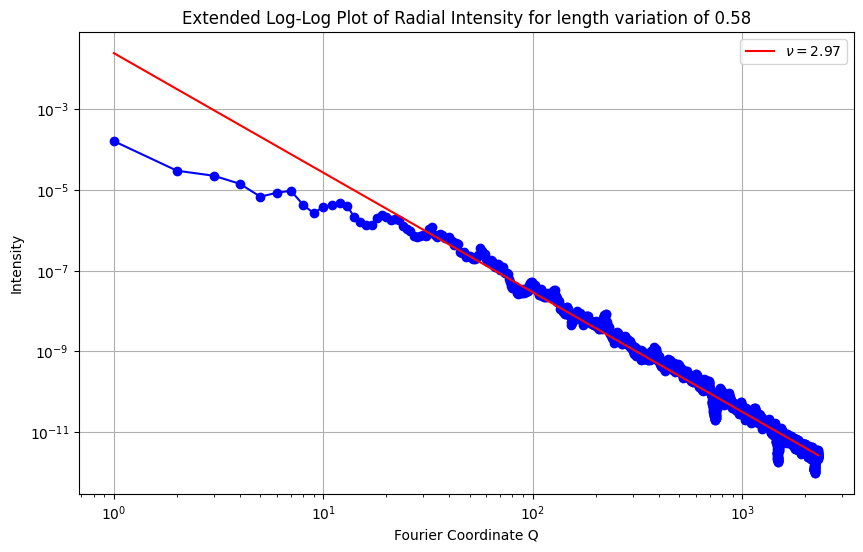

...

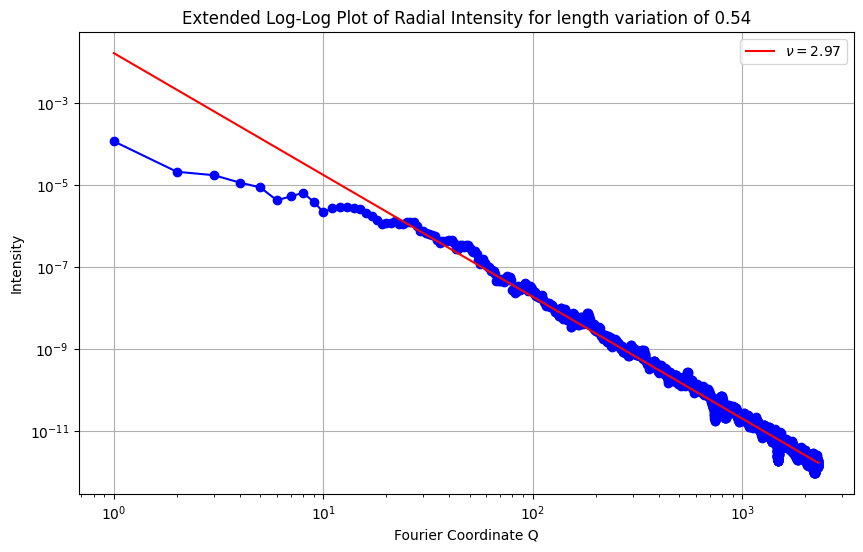

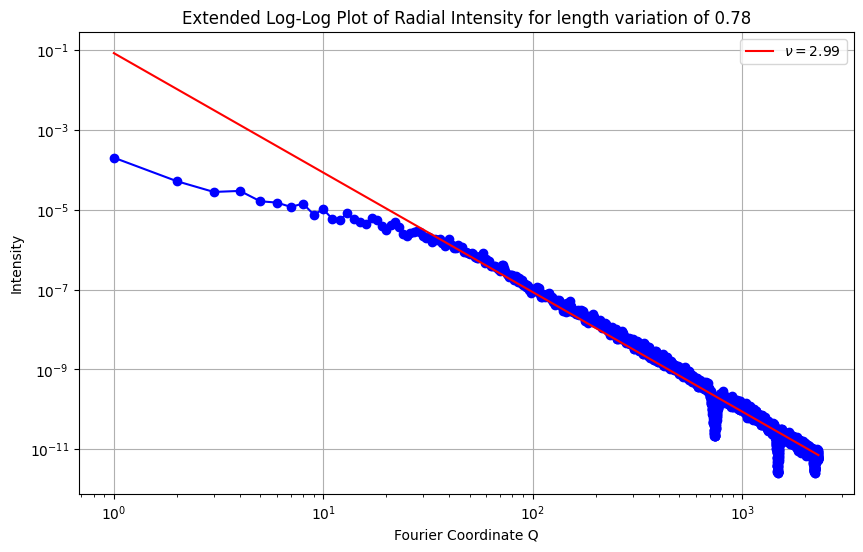

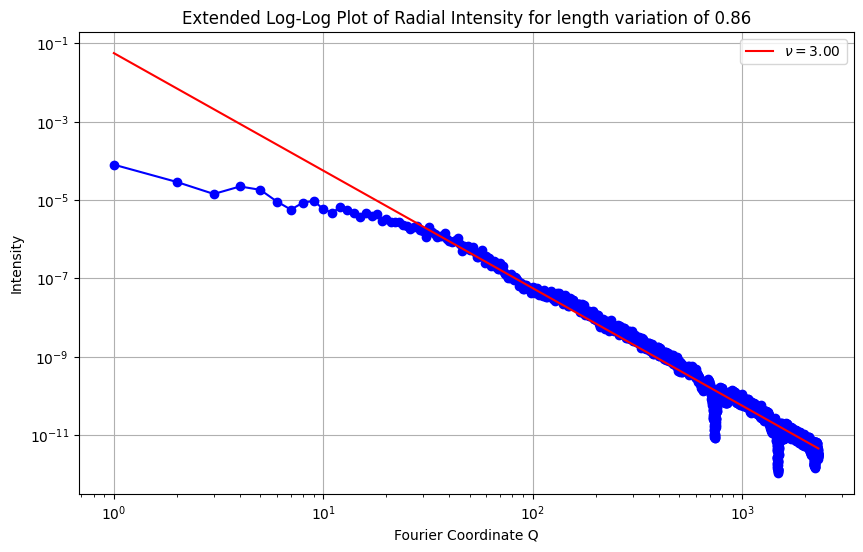

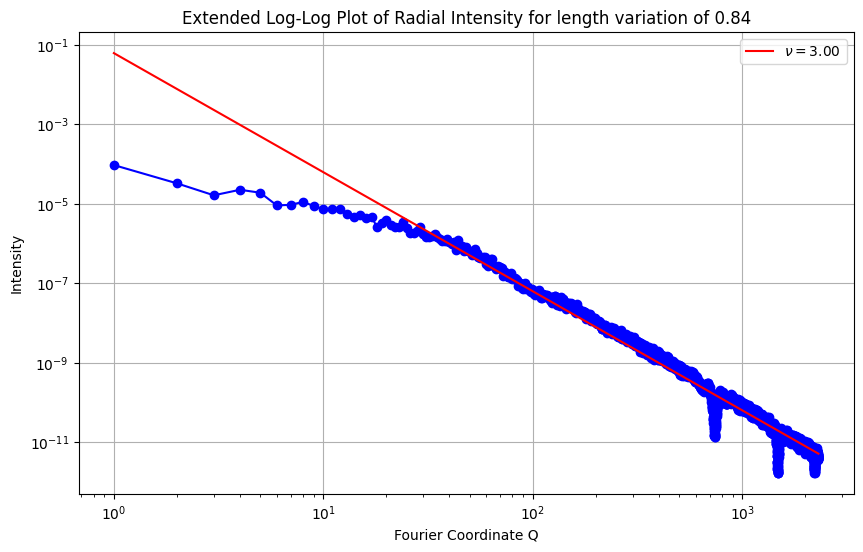

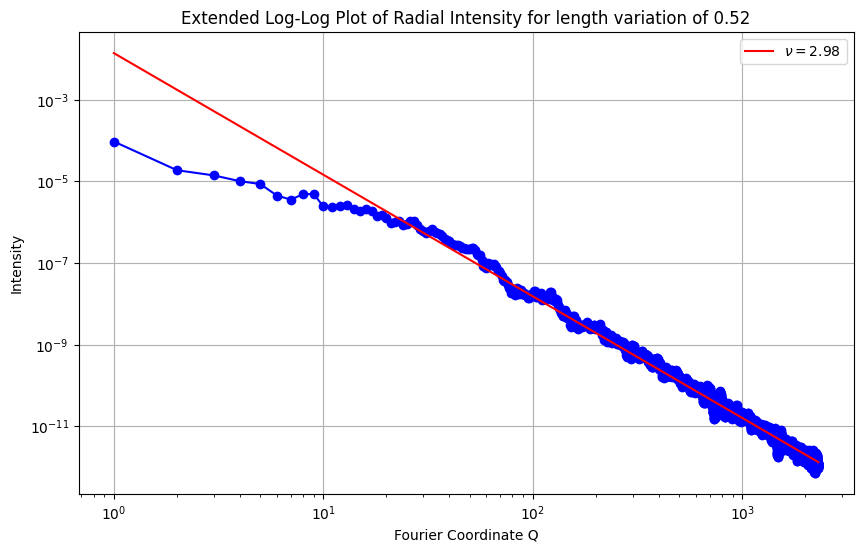

In [6]:

image_files = glob.glob('varied_lengths/fractal_length_*.png')

for image_path in image_files:
    image = plt.imread(image_path)
    if image.ndim == 3:
        image = np.mean(image, axis=2)
    image = image / image.max()

    f = fftpack.fftshift(fftpack.fft2(image))
    power_spectrum = np.abs(f)**2 / f.size

    center = (image.shape[0] // 2, image.shape[1] // 2)
    max_radius = np.min(center)
    radial_prof = radial_profile(power_spectrum, center, max_radius)
    radial_prof = radial_prof / np.max(radial_prof)

    Q_extended = np.arange(1, len(radial_prof))
    m, b = np.polyfit(np.log10(Q_extended), np.log10(radial_prof[1:]), 1)
    linear_fit_results = m * np.log10(Q_extended) + b

    # Extract angle number from filename
    # label_num = os.path.basename(image_path).split('_')[-1].split('.')[0]
    # print(label_num)
    
    # Correct extraction of the label_num to handle floating point numbers
    label_num = os.path.basename(image_path).split('_')[-1][:-4]  # Remove the '.png' and extract the number
    
    # Save power spectrum to CSV
    save_path = f'varied_lengths/power_spectrum_length_{label_num}.csv'
    np.savetxt(save_path, np.column_stack((Q_extended, radial_prof[1:])), delimiter=',', header='Q,Intensity', comments='')


    plt.figure(figsize=(10, 6))
    plt.loglog(Q_extended, radial_prof[1:], marker='o', linestyle='-', color='blue')
    plt.loglog(Q_extended, 10**(linear_fit_results), linestyle='-', color='red', label=rf'$\nu = {-m:.2f}$')
    plt.xlabel('Fourier Coordinate Q')
    plt.ylabel('Intensity')
    plt.title(f'Extended Log-Log Plot of Radial Intensity for length variation of {label_num}')
    plt.legend()
    plt.grid(True)

    # Save plot as PNG
    plot_save_path = f'varied_lengths/plot_length_{label_num}.png'
    plt.savefig(plot_save_path, format='png', dpi=300)
    plt.show()

